# Chaotic Systems 2

Teng-Jui Lin

Content from UW AMATH 301, Beginning Scientific Computing. Although not covered in Spring 2020, the topic is presented in previous years: (1) [Application of Runge-Kutta to Lorenz Equation](https://www.youtube.com/watch?v=EXvLju3DLMY), (2) [Vectorized Time-step Integrators](https://www.youtube.com/watch?v=f0dRidnR2dw).

- Chaotic system
    - Lorenz system (continued)
        - A cube of initial conditions
    - Visialization techniques
        - Interactive plotting
        - Animations

## Lorenz system (review)

The Lorenz system is a system of nonlinear ODEs developed by Edward Lorenz in 1963 to model atmospheric convection. The system

$$
\begin{aligned}
\dot{x} &= \sigma (y-x) \\
\dot{y} &= x(\rho-z) - y \\
\dot{z} &= xy - \beta z
\end{aligned}
$$

with parameters $\sigma = 10, \rho = 28, \beta = 8/3$ can lead to chaotic behavior, where the behavior is unpredictable and sensitive to initial condition and error accumulation.

Note on animation: for local reproducible results, [download ffmpeg and add to path variable](https://www.thewindowsclub.com/how-to-install-ffmpeg-on-windows-10). For reproducible results online, use Google Colab and run the command below.

In [1]:
# Run the command in Google Colab for reproducible results online
# !apt install ffmpeg

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import scipy
from scipy import integrate

In [3]:
# plot settings
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

plt.rcParams.update({
    'font.family': 'Arial',  # Times New Roman, Calibri
    'font.weight': 'normal',
    'mathtext.fontset': 'cm',
    'font.size': 18,
    
    'lines.linewidth': 2,
    
    'axes.linewidth': 2,
    'axes.spines.top': False,
    'axes.spines.right': False,
    'axes.titleweight': 'bold',
    'axes.titlesize': 18,
    'axes.labelweight': 'bold',
    
    'xtick.major.size': 8,
    'xtick.major.width': 2,
    'ytick.major.size': 8,
    'ytick.major.width': 2,
    
    'figure.dpi': 80,
    'savefig.dpi': 300,
    
    'legend.framealpha': 1, 
    'legend.edgecolor': 'black',
    'legend.fancybox': False,
    'legend.fontsize': 14,
    
    'animation.html': 'html5',
})

### A cube of initial conditions

**Problem Statement.** Solve the Lorenz system with cubes of initial conditions of

- a cube of points with dimension of 40 with intervals $\Delta x = \Delta y = \Delta z = 2$ centered around $C = (-8, 8, 27)$
  - for $t \in [0, 2]$ with $\Delta t = 1/300$
- a cube of points with dimension of 20 with intervals $\Delta x = \Delta y = \Delta z = 1$ centered around $C = (0, 0, 0)$
  - for $t \in [0, 5]$ with $\Delta t = 1/200$
- a cube of points with dimension of 2 with intervals $\Delta x = \Delta y = \Delta z = 0.1$ centered around $C = (0, 0, 0)$
  - for $t \in [0, 25]$ with $\Delta t = 1/50$
- a cube of points with dimension of 2 with intervals $\Delta x = \Delta y = \Delta z = 0.1$ centered around $C = (1, -1, 5)$
  - for $t \in [0, 15]$ with $\Delta t = 1/100$
- a cube of points with dimension of 2 with intervals $\Delta x = \Delta y = \Delta z = 0.1$ centered around $C = (3, 3, 3)$
  - for $t \in [0, 15]$ with $\Delta t = 1/70$

using the above parameters. Generate an interactive plot of the trajectory over time. Save the the interactive plot as an animation.

**Solution.** Here, we demonstrate the last set of initial conditions.

#### Solving the systems and static plot

In [4]:
# Lorenz's chaotic parameters
sigma = 10
beta = 8/3
rho = 28

In [5]:
# initial conditions defining params
dimension = 2
interval = 0.1
center = np.array([3, 3, 3])

In [6]:
# calculate cube of initial conditions
half_dim = dimension / 2
xvec = np.arange(-half_dim, half_dim+interval/2, interval)
yvec = np.arange(-half_dim, half_dim+interval/2, interval)
zvec = np.arange(-half_dim, half_dim+interval/2, interval)
x_len = len(xvec)
y_len = len(yvec)
z_len = len(zvec)
initial_val_vec = np.array(np.meshgrid(xvec+center[0], yvec+center[1], zvec+center[2]))

In [7]:
# time array
t_initial = 0
t_final = 15
dt = 1/70
t = np.arange(t_initial, t_final+dt/2, dt)
t_len = len(t)
t_len

1051

In [8]:
# define ode system
dxdt = lambda x, y, z : sigma*(y - x)
dydt = lambda x, y, z : x*(rho - z) - y
dzdt = lambda x, y, z : x*y - beta*z

In [9]:
def ode_syst(t, v):
    '''System of ODEs for Lorenz system.'''
    # convert 1d input from solve_ivp() back to proper dimension
    v = v.reshape(3, x_len, y_len, z_len)
    return np.array([dxdt(*v), dydt(*v), dzdt(*v)])

In [10]:
# solve ode system
# note: solve_ivp() only accepts 1d array as initial condition, 
# so ode_syst need to covert the initial condition vector back
ode_soln_raw = scipy.integrate.solve_ivp(ode_syst, 
                                     [t_initial, t_final], 
                                     initial_val_vec.reshape(-1), 
                                     t_eval=t, vectorized=True).y
# reshape the soln dimension to proper form
ode_soln = ode_soln_raw.reshape(3, x_len*y_len*z_len, len(t))

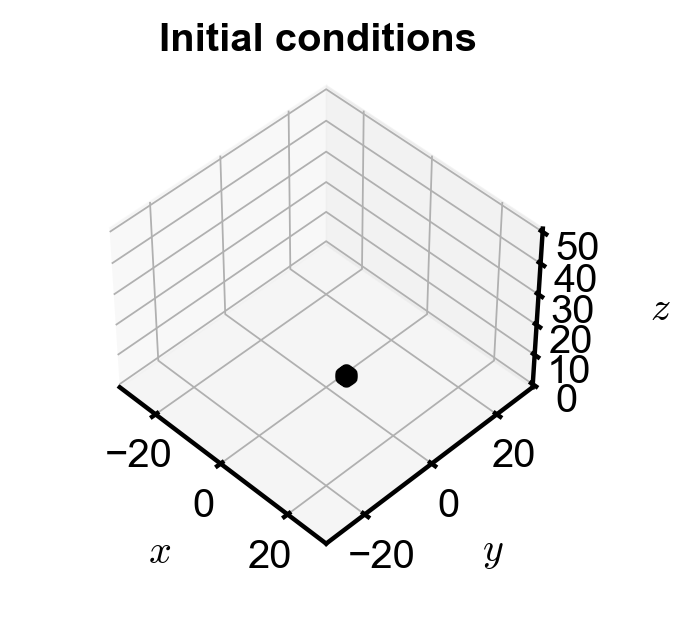

In [11]:
# plot 3d visualization
plt.rcParams.update({'xtick.labelsize': 18,})
fig, ax = plt.subplots(figsize=(5, 5), subplot_kw={"projection": "3d"})
ax.plot(*ode_soln[:, :, 0], '.', color='black', alpha=0.1)

# plot setting
ax.set_xlabel('$x$', fontsize=18, labelpad=20)
ax.set_ylabel('$y$', fontsize=18, labelpad=20)
ax.set_zlabel('$z$', fontsize=18, labelpad=20)
ax.set_title(f'Initial conditions', fontsize=18, y=1)
ax.set_xlim(-30, 30)
ax.set_ylim(-30, 30)
ax.set_zlim(0, 50)
ax.view_init(45, -45)  # viewing angle
ax.dist = 13  # zoom out to fit all labels in

#### Interactive plot and animation of trajectory over time

In [12]:
# animation parameters
# note that here we assume one frame per data dt
fps = 60
anim_time = t_len / fps  # s
frame_num = t_len

In [13]:
# interactive plot
%matplotlib qt

# plot static portion
fig, ax = plt.subplots(figsize=(7, 7), subplot_kw={"projection": "3d"})
ax.set_xlim(-30, 30)
ax.set_ylim(-25, 25)
ax.set_zlim(0, 50)
ax.set_axis_off()

# plot empty framework
points, = ax.plot([], [], [], '.', color='black', alpha=0.1)
title = ax.set_title('')

# update changes each frame
for n in range(frame_num):
    time_points = round(t_len/frame_num)
    points.set_data(ode_soln[:2, :, time_points*n:time_points*n+time_points].reshape(2, -1))
    points.set_3d_properties(ode_soln[2, :, time_points*n:time_points*n+time_points].flatten())
    title.set_text(f't = {t[n] :.3f}')
    plt.pause(0.00001)

In [14]:
# back to static plot and animations
%matplotlib inline

# plot static portion
fig, ax = plt.subplots(figsize=(7, 7), subplot_kw={"projection": "3d"})
ax.set_xlim(-30, 30)
ax.set_ylim(-25, 25)
ax.set_zlim(0, 50)
ax.set_axis_off()

# plot empty framework
points, = ax.plot([], [], [], '.', color='black', alpha=0.1)
title = ax.set_title('')


def draw_frame(n):
    '''
    Commands to update parameters.
    Here, the 3d data points and title changes each frame.
    '''
    time_points = round(t_len/frame_num)
    points.set_data(ode_soln[:2, :, time_points*n:time_points*n+time_points].reshape(2, -1))
    points.set_3d_properties(ode_soln[2, :, time_points*n:time_points*n+time_points].flatten())
    title.set_text(f't = {t[n] :.3f}')
    return fig,

# create animation of the data
# note that here we assume one frame per data dt
# the expected animation time is t_len/60
from matplotlib import animation
anim = animation.FuncAnimation(fig, draw_frame, frames=frame_num, interval=1000/fps, blit=True)

plt.close()

In [15]:
# convert animation to video (time-limiting step)
from IPython.display import HTML
HTML(anim.to_html5_video() + '<style>video{width: 400px !important; height: auto;}</style>')